In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate
import numpy.fft as fft

from scipy.signal import welch


## Linear Algebra


In [2]:
## Vector

v =np.array([2,3,4])
p =np.array([2,5,4])

dot_vp = np.dot(v,p)
print(dot_vp)

35


In [3]:
v1 =np.array([[2,3,4],
            [2,5,4]])
        
print(v1.size)

print(v1[:,:-1])



6
[[2 3]
 [2 5]]


In [4]:
## matrix multiplication

v1 =np.array([[2,3,4],
            [2,5,4]])

v2 =np.array([[2,0,4],
            [2,2,2],
            [2,2,2]])

c =v1.dot(v2)

print(c)

print(v1.shape, v2.shape, c.shape)

[[18 14 22]
 [22 18 26]]
(2, 3) (3, 3) (2, 3)


In [5]:
v1 =np.array([[2,3,4],
            [2,5,4]])

v2 =np.array([[2],
            [2],
            [2]])

c =v1.dot(v2)

print(c)

print(v1.shape, v2.shape, "-->", c.shape)

[[18]
 [22]]
(2, 3) (3, 1) --> (2, 1)


In [6]:
v1_T =v1.T
print(v1_T)
print(v1_T.shape)

[[2 2]
 [3 5]
 [4 4]]
(3, 2)


In [7]:
sq_matrix = np.array([[13,12,4],
                      [2,10, 5],
                      [3,5, 0]])
det_sm = np.linalg.det(sq_matrix)
print(det_sm)

-225.0


In [8]:
rand_sq_matrix = np.random.randint(0, 4,(3,3))
print(rand_sq_matrix)

[[2 1 1]
 [3 3 1]
 [3 1 0]]


In [9]:
## Inverse of a matrix
## (adjoint of a matrix)/det of the matrix
## cofactor transpose of a matrix is adjoint of a matrix


In [10]:


print("**"*24)

inverse_matrix=np.linalg.inv(rand_sq_matrix)

print("direct inverse calculation\n", np.linalg.inv(rand_sq_matrix))

************************************************
direct inverse calculation
 [[ 0.2 -0.2  0.4]
 [-0.6  0.6 -0.2]
 [ 1.2 -0.2 -0.6]]


In [11]:
## element print of the inverse matrix
for i in inverse_matrix.T:
    for j in i:
        print(j)

0.19999999999999996
-0.6
1.2
-0.19999999999999996
0.6
-0.19999999999999996
0.4
-0.2
-0.6


In [12]:
rank = np.linalg.matrix_rank(inverse_matrix)
print(rank)

3


In [13]:
eigvals, eigvecs = np.linalg.eig(rand_sq_matrix)
print(eigvals,'\n', "**"*5,'\n',eigvecs)

[ 5.  1. -1.] 
 ********** 
 [[-4.08248290e-01 -4.08248290e-01 -3.16227766e-01]
 [-8.16496581e-01  8.16496581e-01  4.37400450e-17]
 [-4.08248290e-01 -4.08248290e-01  9.48683298e-01]]


## Signal Processing


(1000,)
(1000,)


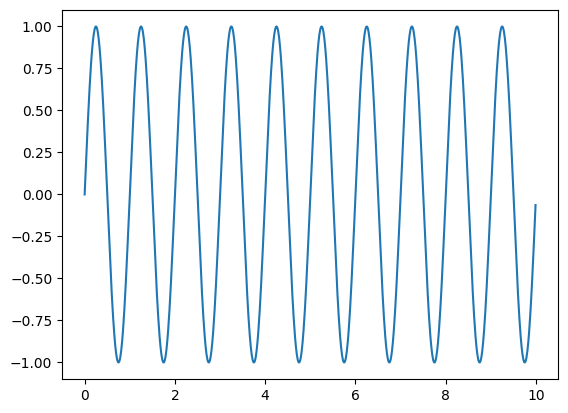

In [14]:
input = np.arange(0, 10, 0.01)
print(input.shape)


## frequency 
w = 1
output = np.sin(2*np.pi*w*input)

plt.plot(input,output)
print(output.shape)

Text(0, 0.5, 'magnitude')

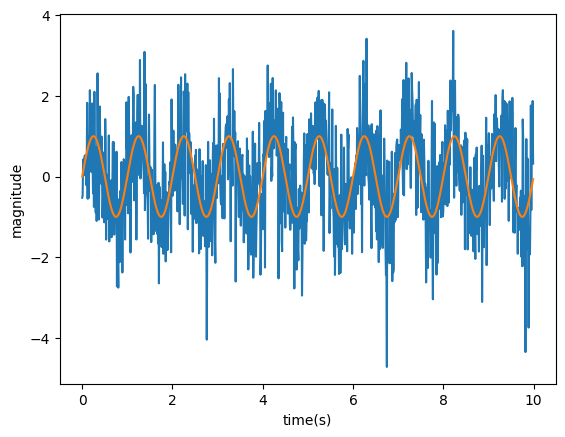

In [15]:
noise = np.random.randn(1000)
noise.shape

noisy_op = output + noise

plt.plot(input, noisy_op)
plt.plot(input, output)
plt.xlabel('time(s)')
plt.ylabel('magnitude')

1000


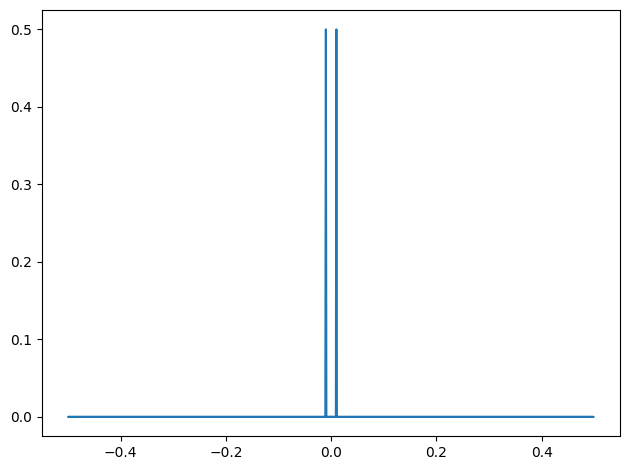

In [16]:
## FFT
N = len(output) ## number of sample
print(N)
out_fft = fft.fft(output) 
out_fft_mag = np.abs(out_fft)/N
freq = fft.fftfreq(N)

plt.plot(freq, out_fft_mag)
plt.tight_layout()

In [17]:
## 
## filter length
M=200

Y= np.array([noisy_op[i:i+M] for i in range(N-M+1)])
output_delay = output[M-1:]

Y.shape

(801, 200)

In [18]:
## auto correlation

R = Y.T@Y
p=Y.T@output_delay

print(R.shape)
print(p.shape)

h_opt =np.linalg.solve(R,p)
print(h_opt)

(200, 200)
(200,)
[ 5.23598886e-03  5.15100384e-03  5.04453021e-03  5.16651718e-03
  5.17865047e-03  4.41114324e-03  4.29152655e-03  3.99764420e-03
  3.31632908e-03  2.24009552e-03  1.83223666e-03  9.88973506e-04
  2.74073578e-05  2.40870569e-04  1.02962542e-04 -5.01899212e-04
 -7.68034554e-04 -1.09182898e-03 -1.66572207e-03 -1.93976112e-03
 -1.81036470e-03 -1.94186836e-03 -2.19478549e-03 -2.67382125e-03
 -3.63804706e-03 -4.11723007e-03 -4.41630415e-03 -5.00791298e-03
 -5.41522978e-03 -5.96352016e-03 -6.34057011e-03 -7.05389473e-03
 -7.06733624e-03 -7.49057171e-03 -8.43613704e-03 -9.15810969e-03
 -8.72258474e-03 -9.86459621e-03 -1.01614185e-02 -1.09051327e-02
 -1.10104626e-02 -1.15170114e-02 -1.12449384e-02 -1.14614353e-02
 -1.09058033e-02 -1.06552243e-02 -1.07006986e-02 -1.11134903e-02
 -1.13545088e-02 -1.06529817e-02 -1.04675809e-02 -1.08848987e-02
 -1.02587011e-02 -1.04486116e-02 -1.07136750e-02 -1.05599608e-02
 -1.04166753e-02 -9.88238752e-03 -9.67411742e-03 -8.92549102e-03
 -8.465

In [19]:
s_hat =Y@h_opt

s_hat.shape

(801,)

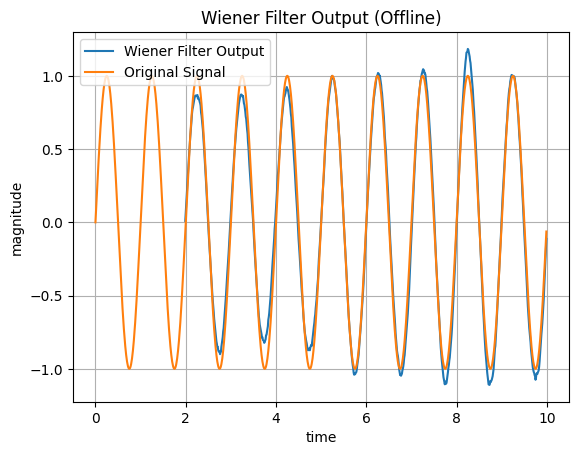

In [20]:
plt.plot(input[M-1:],s_hat)
plt.plot(input, output)
plt.title("Wiener Filter Output (Offline)")
plt.xlabel('time')
plt.ylabel('magnitude')
plt.legend(['Wiener Filter Output','Original Signal'])
plt.grid()
plt.show()

## Implementing Wiener Filter for an audio file
 

In [39]:
import numpy as np
import librosa
import soundfile as sf
import matplotlib.pyplot as plt

# 1. Load an audio file
audio_path = r"D:\CS\Signal-Processing\Sample Data\1-4211-A-12.wav"   # replace with your file
x, sr = librosa.load(audio_path, sr=None)  # x = samples, sr = sampling rate

# 2. Generate Gaussian noise
noise = np.random.normal(0, 0.02, len(x))   # mean=0, std=0.02

# 3. Add noise to audio
noisy_x = x + noise

In [44]:
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

t = np.arange(len(x)) / sr
N= len(x)

fig =px.line(x=t, y=x)
fig.show()


In [42]:
fig1=px.line(x=t, y=noisy_x)
fig1.show()

In [57]:

# 4. Frequency domain (FFT)
x_fft = np.fft.fft(x)
noisy_x_fft = np.fft.fft(noisy_x)
freqs = np.fft.fftfreq(len(x), 1/sr)

# Only take positive frequencies
pos_mask = freqs >= 0
freqs = freqs[pos_mask]
X_mag = np.abs(x_fft)[pos_mask]
Y_mag = np.abs(noisy_x_fft)[pos_mask]


fig = make_subplots(rows=2, cols=1, subplot_titles=("Signal 1", "Signal 2"))

# Add first signal
fig.add_trace(px.line(x=freqs, y=X_mag).data[0], row=1, col=1)

# Add second signal
fig.add_trace(px.line(x=freqs, y=Y_mag).data[0], row=2, col=1)

fig.update_layout(height=600, title="Two Separate Signals in Subplots")
fig.show()

In [25]:
## 
## filter length
M=200

Y= np.array([noisy_x[i:i+M] for i in range(N-M+1)])
x_delay = x[M-1:]

Y.shape

(220301, 200)

In [59]:
## auto correlation

R_xx = x.T@x
R_nn = noise.T@noise

R_sum = R_xx + R_nn

## Cross correlation

R_yd = x.T@noisy_x

# p=Y.T@x_delay

print(R_sum.shape)
print(R_yd.shape)

# h_opt =np.linalg.solve(R_sum,R_yd)
print(h_opt)

()
()
[ 9.66322895e-06 -4.33243332e-05  1.09838540e-04 -2.15182126e-04
  3.58692780e-04 -5.15337872e-04  6.56332430e-04 -7.56457970e-04
  8.00013819e-04 -7.85230837e-04  7.26868275e-04 -6.38335923e-04
  5.32459957e-04 -4.06235045e-04  2.51421970e-04 -6.54745826e-05
 -1.44517830e-04  3.52240337e-04 -5.22134406e-04  6.13032382e-04
 -5.95405777e-04  4.60931590e-04 -2.26177110e-04 -6.11025665e-05
  3.37201206e-04 -5.35908373e-04  6.06046045e-04 -5.28643782e-04
  3.21123996e-04 -4.14130595e-05 -2.35904922e-04  4.49945116e-04
 -5.64092237e-04  5.75119051e-04 -5.03125230e-04  3.76614811e-04
 -2.11736414e-04  9.40388087e-06  2.20310982e-04 -4.55899093e-04
  6.49619420e-04 -7.41289762e-04  6.92533839e-04 -5.15743407e-04
  2.82958369e-04 -9.97380726e-05  5.92830987e-05 -1.86680576e-04
  4.12456857e-04 -6.04874881e-04  6.34055708e-04 -4.34371356e-04
  5.34716031e-05  3.61786021e-04 -6.51504563e-04  7.16539820e-04
 -5.82580072e-04  3.74575811e-04 -2.52385181e-04  3.20774631e-04
 -5.67688051e-04  8

In [27]:
s_hat =Y@h_opt

s_hat.shape

(220301,)